## Foundations of Data Mining: Assignment 2

Please complete all assignments in this notebook. You should submit this notebook, as well as a PDF version (See File > Download as).

In [1]:
# Please fill in your names here
NAME_STUDENT_1 = "Celine Senden"
NAME_STUDENT_2 = "Koen Klaren"

In [2]:
%matplotlib inline
from preamble import *
plt.rcParams['savefig.dpi'] = 100 # This controls the size of your figures
# Comment out and restart notebook if you only want the last output of each cell.
# InteractiveShell.ast_node_interactivity = "all" 
HTML('''<style>html, body{overflow: visible !important} .CodeMirror{min-width:105% !important;} .rise-enabled .CodeMirror, .rise-enabled .output_subarea{font-size:140%; line-height:1.2; overflow: visible;} .output_subarea pre{width:110%}</style>''') # For slides

## Support Vector Bananas (4 points (2+2))
We will first explore SVM kernels and hyperparameters on an artificial dataset representing multiple banana shapes. 

In [29]:
from sklearn.model_selection import *
bananas = oml.datasets.get_dataset(1460) # Download banana data
X, y = bananas.get_data(target=bananas.default_target_attribute);
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=1/4)

1 . Evaluate how well an SVM classifier can fit the data. 

- Use a linear, polynomial and radial basis function (RBF) kernel, using their default hyperparameters. Evaluate the performance of each kernel using the test set and AUC. Which one works best? 
- Visualize the results using the visualization code also used in class (under mglearn/plot_svm.py > plot_svm_kernels). Also show the AUC score and the number of support vectors. Explain intuitively how well the data is fitted, why the kernel is (not) able to fit the data, whether it is under- or overfitting, etc.

In [4]:
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score

kernels = [
    'linear',
    'poly',
    'rbf'
]

for kernel in kernels:
    svc = SVC(kernel=kernel)
    svc.fit(X_train, y_train)
    svc_auc = roc_auc_score(y_test, svc.decision_function(X_test))
    print("AUC for SVC ({}): {:.2f}".format(kernel, svc_auc))

AUC for SVC (linear): 0.51
AUC for SVC (poly): 0.75
AUC for SVC (rbf): 0.97


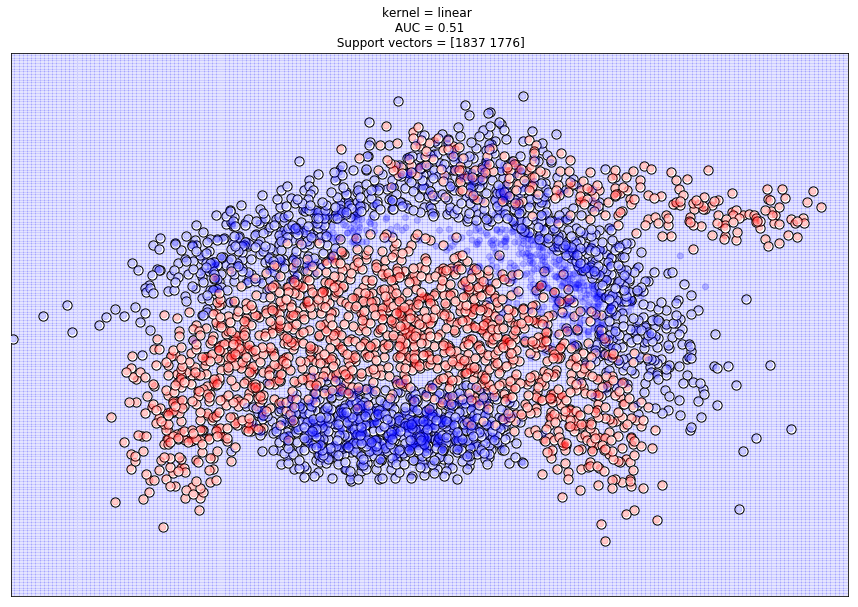

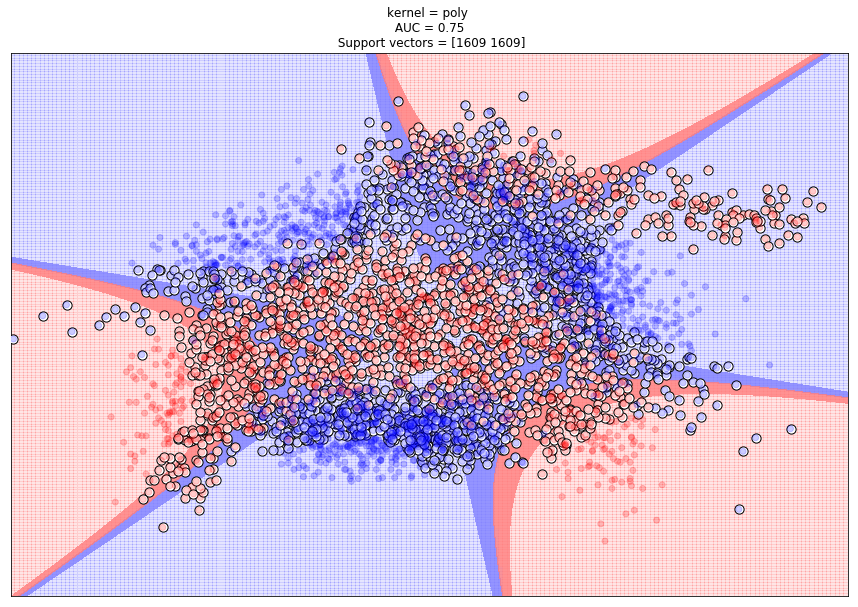

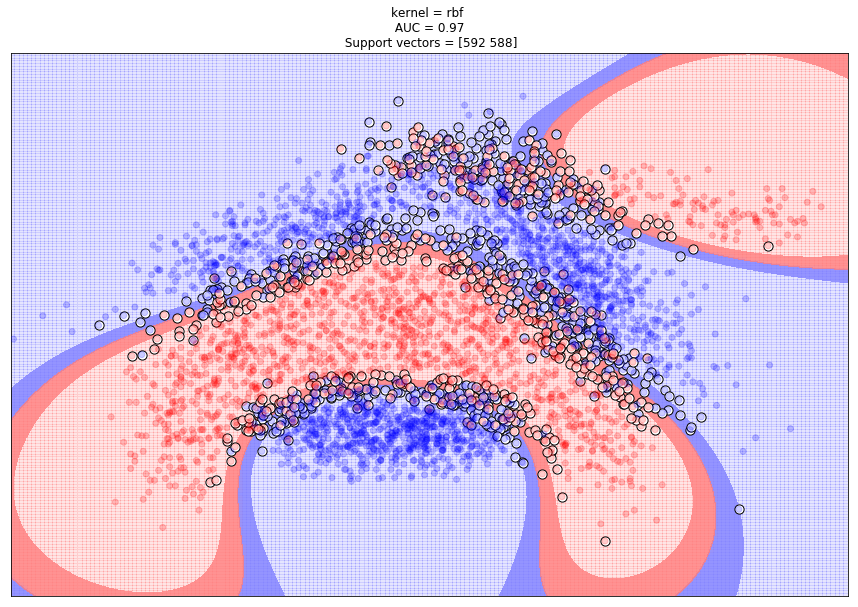

In [5]:
def plot_svm(clf):
    # plot the line, the points, and the nearest vectors to the plane

    plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
                s=85, edgecolors='k', c='w', zorder=10)
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, zorder=10, cmap=plt.cm.bwr, alpha=0.2)

#     for i, coef in enumerate(clf.dual_coef_[0]):
#         plt.annotate("%0.2f" % (coef), (clf.support_vectors_[i, 0]+0.15,clf.support_vectors_[i, 1]), fontsize=8, zorder=11)

    plt.axis('tight')
    x_min = -3
    x_max = 3
    y_min = -3
    y_max = 3

    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(XX.shape)
    plt.pcolormesh(XX, YY, Z > 0, cmap=plt.cm.bwr, alpha=0.1)
    plt.contourf(XX, YY, Z, cmap=plt.cm.bwr, alpha=0.8, linestyles=['--', '-', '--'],
                levels=[-.5, 0, .5])

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(())
    plt.yticks(())
    
    svc_auc = roc_auc_score(y_test, clf.decision_function(X_test))
    n_support = clf.n_support_
    plt.title('kernel = {} \n AUC = {:.2f} \n Support vectors = {}'.format(kernel, svc_auc, n_support))

# fit the model
for kernel in kernels:
    clf = SVC(kernel=kernel)
    clf.fit(X_train, y_train)
    
    plt.figure(figsize=(15, 10))
    plot_svm(clf)
    plt.show()

2 . Pick the RBF kernel and optimize the two most important hyperparameters (the $C$ parameter and the kernel width $\gamma$). 

- First, optimize manually using 3 values for each (a very small, default, and very large value). For each of the 9 combinations, create the same RBF plot as before, report the number of support vectors, and the AUC performance. Explain the performance results. When are you over/underfitting?
- Next, optimize the hyperparameters using a grid search and 10-fold cross validation. Show a heatmap of the results snd report the optimal hyperparameter values.
    - Hint: values for C and $\gamma$ are typically in [$2^{-15}..2^{15}$] on a log scale. Use at least 10 values for each.

In [6]:
n_features = X.shape[1]
clfs = []

for C in np.logspace(-1, 1, 3):
    for gamma_numerator in np.logspace(-1, 1, 3):
        gamma = gamma_numerator / n_features
        
        clf = SVC(kernel='rbf', C=C, gamma=gamma)
        clf.fit(X_train, y_train)
        clfs.append(clf)

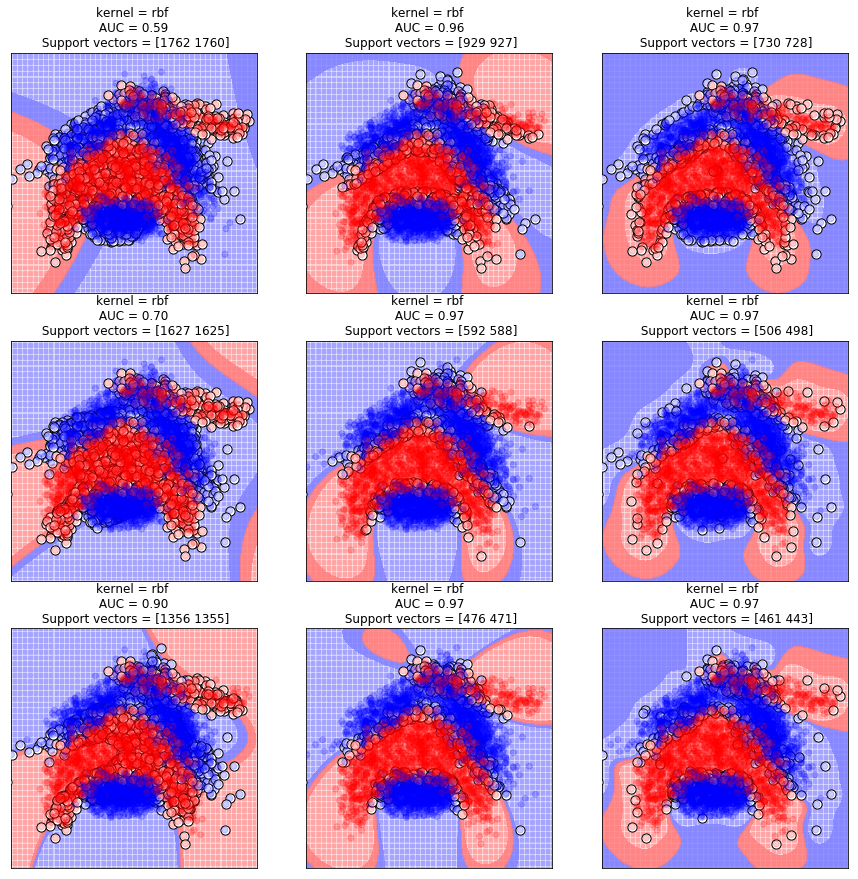

In [7]:
fig = plt.figure(figsize=(15,15))   

for i, clf in enumerate(clfs):
    ax = fig.add_subplot(3, 3, i+1)
    plt.sca(ax)
    plot_svm(clf)

In [77]:
from sklearn.model_selection import GridSearchCV 
from sklearn.svm import SVC
import numpy as np

C_range = np.logspace(-15, 15, 10, base=2)
gamma_range = np.logspace(-15, 15, 10, base=2)

param_grid = {'C': C_range, 'gamma': gamma_range}
# print("Parameter grid:\n{}".format(param_grid))

grid_search = GridSearchCV(SVC(), param_grid, cv=10, scoring="roc_auc", n_jobs=-1)
grid_search.fit(X_train, y_train)

AUC_scores = np.array(grid_search.cv_results_['mean_test_score']).reshape(10,10);

Best parameters: {'C': 322.53978877308805, 'gamma': 0.3149802624737184}


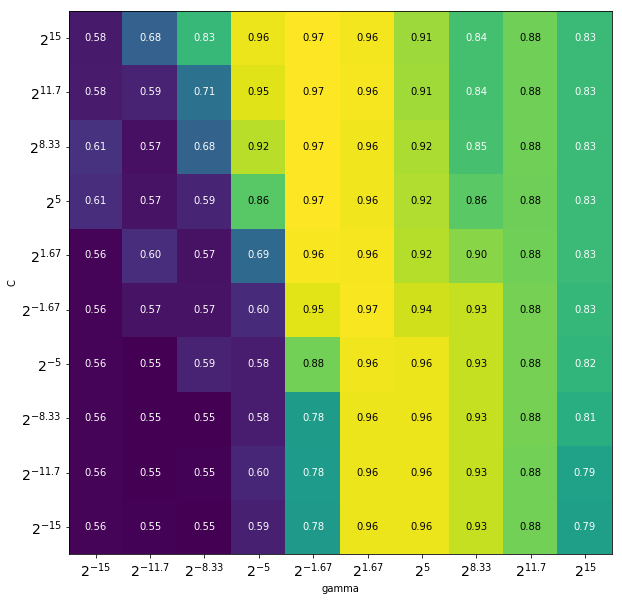

In [78]:
fig=plt.figure(figsize=(10,10))

def format_labels(values):
    return [r'$2^{{{:.3g}}}$'.format(e) for e in np.log2(values)]

mglearn.tools.heatmap(AUC_scores, xlabel='gamma', xticklabels=format_labels(gamma_range),
                      ylabel='C', yticklabels=format_labels(C_range), cmap="viridis");

plt.gca().xaxis.set_tick_params(labelsize=14)
plt.gca().yaxis.set_tick_params(labelsize=14)

print("Best parameters: {}".format(grid_search.best_params_))

## Building Kernels (4 points (0.5+0.5+1+2))

Consider the artificial dataset given below. It represents a sine wave with added noise.

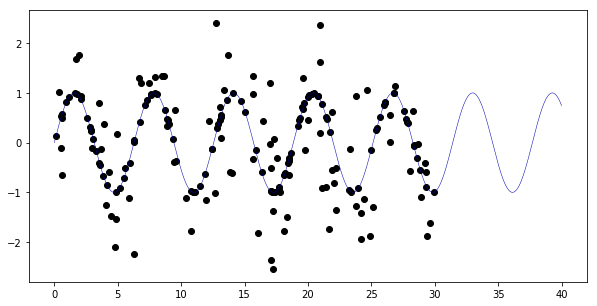

In [3]:
# Generate sample data
rng = np.random.RandomState(0) # Random seed, for reproducibility 
X = 30 * rng.rand(200, 1)
y = np.sin(X).ravel() 
y[::2] += rng.normal(scale = 1.0, size = X.shape[0] // 2) # adds noise

X_plot = np.linspace(0, 40, 10000)[:, None] # A larger range to evaluate on
true_y = np.sin(X_plot) # and the 'true' target function

plt.figure(figsize=(10, 5))
plt.scatter(X, y, c='k', label='Data')
plt.plot(X_plot, true_y);

1 . Fit an SVM Regressor with the default RBF kernel, and plot the predictions on all data points in [0, 40]. 

- Does it fit the data well? Does it extrapolate well (in the range [30,40])? Explain your findings. 
- Can you get better results by tweaking the kernel or the other SVM parameters?
    

In [4]:
def plot_pred_vs_true(svr, make_fig=True):
    pred_y = svr.predict(X_plot)
    
    if (make_fig):
        plt.figure(figsize=(10, 5))
    plt.plot(X_plot, true_y, '-', linewidth=1)
    plt.plot(X_plot, pred_y, '-', linewidth=1, zorder=3);

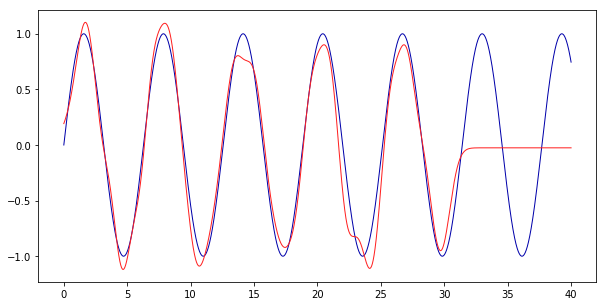

In [5]:
from sklearn.svm import SVR

svr = SVR(kernel='rbf')
svr.fit(X, y)
plot_pred_vs_true(svr)

**Does it fit the data well? Does it extrapolate well (in the range [30,40])? Explain your findings.**

In the range [0,30] the regressor fits the data reasonably well. That is, the hills and valleys are in the same places. But it is not consistent in giving a clean fit on the peaks, this is likely because of some artifacts in the sample data. 

It does not extrapolate well at all. After 30 the regressor goes back to zero and stays there, it does not repeat the pattern.

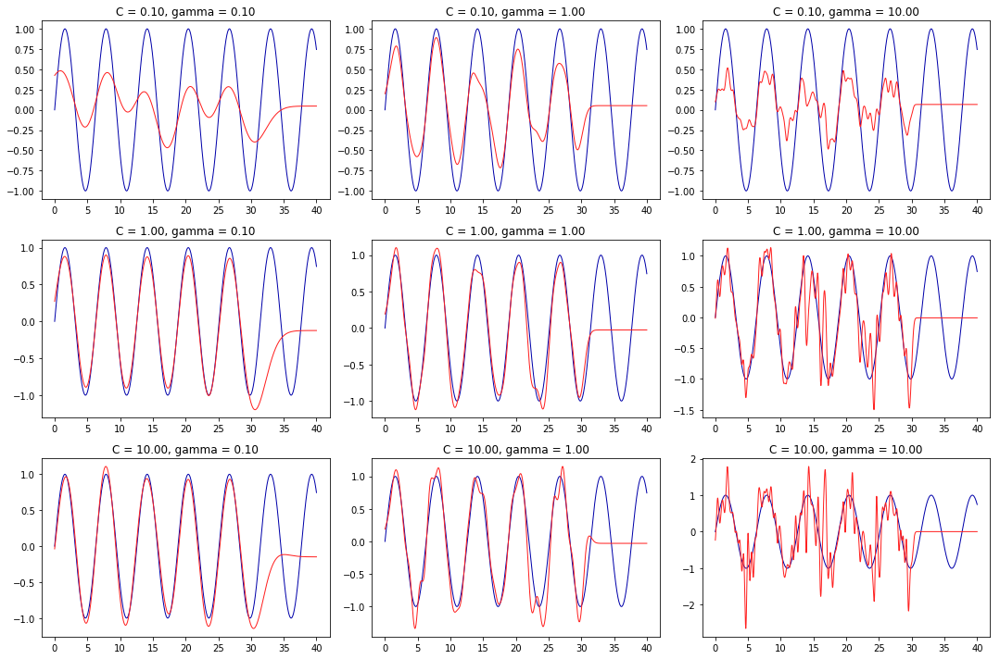

In [7]:
n_features = X.shape[1]
svrs = []

for C in np.logspace(-1, 1, 3):
    for gamma in np.logspace(-1, 1, 3):
        svr = SVR(kernel='rbf', C=C, gamma=gamma)
        svr.fit(X, y)
        svrs.append(svr)

fig = plt.figure(figsize=(15,10))

for i, svr in enumerate(svrs):
    ax = fig.add_subplot(3, 3, i+1)
    plt.title('C = {:.2f}, gamma = {:.2f}'.format(svr.C, svr.gamma))
    plot_pred_vs_true(svr, False)

plt.tight_layout()

**Can you get better results by tweaking the kernel or the other SVM parameters?**

By tweaking the C and Gamma parameters we can get better results in the [0,30] range. See the graph in the bottom-left with `C=10.00, gamma=0.10`, it fits the sine data much better than with the default parameters (in the middle). Though it still does not extrapolate well after the point it was trained on.

2 . Implement your own linear kernel. This is a function that takes 2 vectors (arrays) and returns the dot product:

$$k(\mathbf{x}_i,\,\mathbf{x}_j) = \mathbf{x}_i \cdot \mathbf{x}_j$$
- Build an SVM regressor using that kernel by passing your kernel function as the `kernel` hyperparameter. 
- Fit it on the sine data and plot the predictions on all data points. Interpret the results.

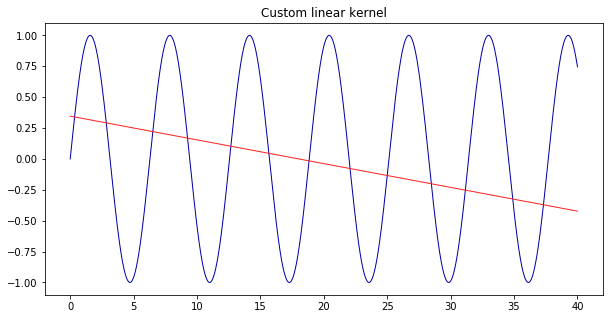

In [8]:
# Custom linear kernel
def linear_kernel(X, Y):
    return np.dot(X, Y.T)

svr = SVR(kernel=linear_kernel)
svr.fit(X, y)
plot_pred_vs_true(svr)
plt.title('Custom linear kernel');

# # Default linear kernel
# svr = SVR(kernel='linear')
# svr.fit(X, y)
# plot_pred_vs_true(svr)
# plt.title('Default linear kernel')

**Fit it on the sine data and plot the predictions on all data points. Interpret the results.**

It obviously predicts in a straight line that is slightly slanted because the sine data starts in the top half.

3 . Since this data is periodic, it makes sense to implement a periodic kernel instead. 

- This is the Exponential Sine Squared kernel, with length scale $\Gamma$ and periodicity $P$:
$$k(\mathbf{x}_i,\,\mathbf{x}_j) = \exp \left( -\Gamma\,\sin^2\left[\frac{\pi}{P}\,\left|\left|x_i-x_j\right|\right|\right]\right)$$
- Implement it, using the defaults $\Gamma=1$, periodicity $P=1$, and Euclidean distance.
- Train an SVM regressor with it, fit in on the same data and plot the result. Interpret the outcome. 
- Think about what $\Gamma$ and $P$ represent. Can you improve the fit by manually adjusting them? Explain your findings.
- Optimize $\Gamma$ and periodicity $P$ (using `true_y` as the ground truth). Use a grid search or random search, $\Gamma \in [0,1]$, $P \in [1,100]$, try at least 5 values for each.

In [9]:
from scipy.spatial.distance import cdist

def make_exp_sine_squared_kernel(G=1.0, P=1.0):
    def exp_sine_squared_kernel(X, Y):
        return np.exp(-G * np.power(np.sin(np.pi / P * cdist(X, Y, metric='euclidean')), 2))
    
    exp_sine_squared_kernel.G = G
    exp_sine_squared_kernel.P = P
    
    return exp_sine_squared_kernel

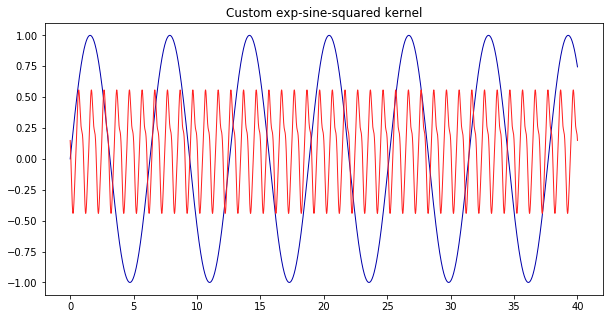

In [10]:
from sklearn.svm import SVR
from sklearn.gaussian_process.kernels import ExpSineSquared

svr = SVR(kernel=make_exp_sine_squared_kernel())
svr.fit(X, y)
plot_pred_vs_true(svr)
plt.title('Custom exp-sine-squared kernel');

# Actual
# svr = SVR(kernel=ExpSineSquared())
# svr.fit(X, y)
# plot_pred_vs_true(svr)

**Train an SVM regressor with it, fit in on the same data and plot the result. Interpret the outcome.**

With the default parameters the Exponential Sine Squared (ESS) kernel predicts in periodic pattern. Though the amplitude and period do not match that of the sine data.

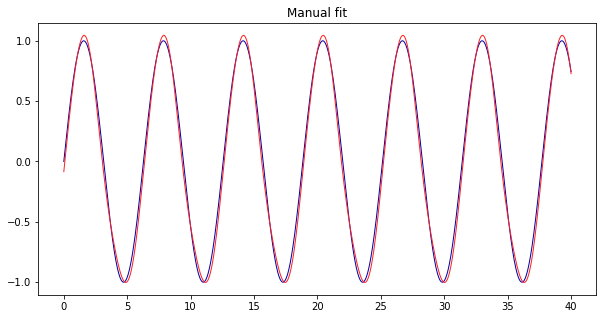

In [11]:
from sklearn.svm import SVR

svr = SVR(kernel=make_exp_sine_squared_kernel(1, 2*np.pi))
svr.fit(X, y)
plot_pred_vs_true(svr)
plt.title('Manual fit');

**Think about what $\Gamma$ and $P$ represent. Can you improve the fit by manually adjusting them? Explain your findings.**

The ESS kernel with $P=1.0$ produced predicted outcomes with a period of $1$. So changing it to the actual period of the data -- that is $2\pi$ (or $\tau$) -- made the period of the predictions exactly match that of the sine data. The default value of $\Gamma=1.0$ appears to work fine.

In [12]:
from sklearn.model_selection import GridSearchCV

G_values = np.linspace(0, 1, 5)
P_values = np.linspace(1, 100, 10)

param_grid = {
    'kernel': [
        make_exp_sine_squared_kernel(G, P)
            for G in G_values
            for P in P_values
    ]
}

svr = SVR()
grid_search = GridSearchCV(svr, param_grid=param_grid)
grid_search.fit(X, y);

scores = np.array(grid_search.cv_results_['mean_test_score']).reshape(len(G_values), len(P_values))

Best parameters: G=1.00 P=12.00


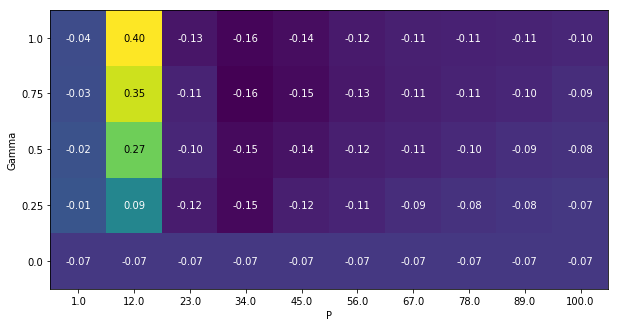

In [13]:
fig = plt.figure(figsize=(10,10))

mglearn.tools.heatmap(scores, ylabel='Gamma', yticklabels=G_values,
                      xlabel='P', xticklabels=P_values, cmap="viridis");

best_kernel = grid_search.best_params_['kernel']
print("Best parameters: G={:.2f} P={:.2f}".format(best_kernel.G, best_kernel.P))

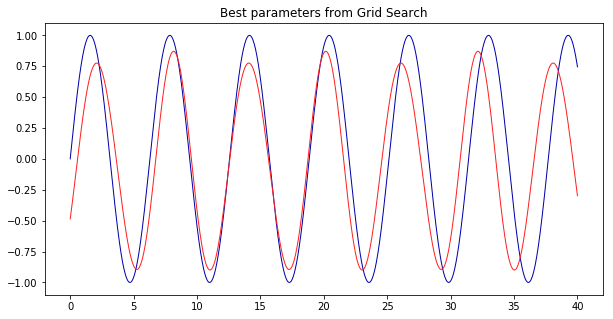

In [15]:
svr = SVR(kernel=make_exp_sine_squared_kernel(1.0, 12.0))
svr.fit(X, y)
plot_pred_vs_true(svr)
plt.title('Best parameters from Grid Search');

**Optimize $\Gamma$ and periodicity $P$ (using `true_y` as the ground truth). Use a grid search or random search, $\Gamma \in [0,1]$, $P \in [1,100]$, try at least 5 values for each.**

Using a rough grid search we get $\Gamma=1.0$ and $P=12.0$ as the best parameters for the ESS kernel. The $\Gamma$ parameter matches with what we found manually. The $P$ value is roughly equal to $4 \pi$ which might explain why it fits best on the sine data.

4 . We now make the problem a bit more challenging by adding an upward trend:

- Fit the same SVM using the optimal parameters from the previous subtask and plot the results. Do they still work? Explain what you see.
- Fit a Gaussian process (GP) using the kernels given below. First use the singular ExpSineSquared kernel (the implementation provided by sklearn this time), then build a new kernel consisting of the 3 components given below. Use both to predict all points for the "rising noisy sine" data and plot the results as usual. Interpret the results.
    - For the GP, it may help to use `normalize_y=True` since the y-values are not around 0. Setting `alpha=0.1` may help with possible numerical issues, otherwise keep it at 0.
- Also plot the _uncertainty interval_ around the predictions. You can ask the GP to return the standard deviation during prediction with the `return_std=True` hyperparameter. Plot a band 2 standard deviations above and below the prediction. You can use MatPlotLib's `fill_between` as shown in class.
    - You can combine the 3 models in one plot for easy comparison.
- We've provided reasonable values for the kernel hyperparameters above. Can you optimize them further to get an even better fit? Think about what the hyperparameters do and optimize the ones you think are most worth tuning.

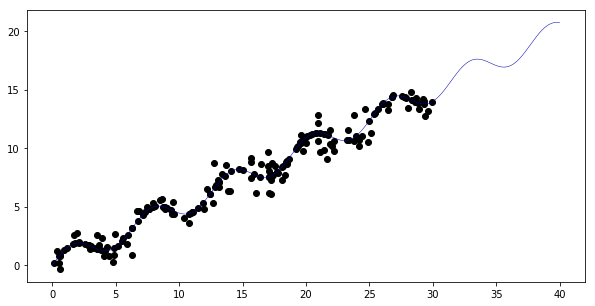

In [16]:
# Generate sample data with added trend
rng = np.random.RandomState(0)
X = 30 * rng.rand(200, 1)
y = X.ravel()/2 + np.sin(X).ravel()
y[::2] += rng.normal(scale = 1.0, size = X.shape[0] // 2)  # add noise

X_plot = np.linspace(0, 40, 10000)[:, None]
true_y = X_plot/2 + np.sin(X_plot)

plt.figure(figsize=(10, 5))
plt.scatter(X, y, c='k', label='Data')
plt.plot(X_plot, true_y);

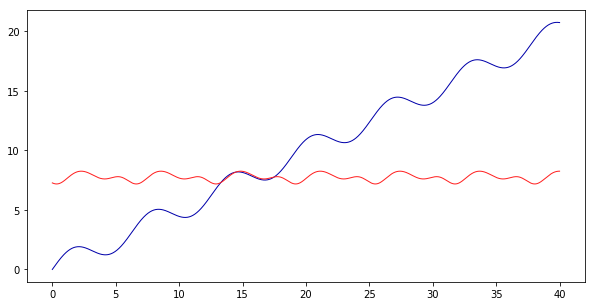

In [18]:
svr = SVR(kernel=make_exp_sine_squared_kernel(1, 2*np.pi))
svr.fit(X, y)
plot_pred_vs_true(svr)

**Fit the same SVM using the optimal parameters from the previous subtask and plot the results. Do they still work? Explain what you see.**

Using our optimal manual parameters ($\Gamma=1.0, P=2\pi$) the SVM regressor predicts with the correct period, but it does not capture the upwards trend. Around $x=15$ it matches the sine data closely for a short while, but since it does not match the upward trend it is very far off the rest of the time.

In [19]:
from sklearn.gaussian_process.kernels import WhiteKernel, ExpSineSquared, RBF

# Replace `length_scale` and `periodicity` with the values found in the previous part.
kernel_simple = ExpSineSquared(length_scale=1, periodicity=2*np.pi) # periodic component

k1 = 4300 * RBF(length_scale=70.0)  # long term smooth rising trend
k2 = 6 * RBF(length_scale=90.0) * ExpSineSquared(length_scale=1.3, periodicity=1.0)  # periodic component
k3 = 0.03 * RBF(length_scale=0.134) + WhiteKernel(noise_level=0.035)  # noise terms

In [21]:
def plot_pred_vs_true_gp(gp, make_fig=True):
    y_pred, sigma = gp.predict(X_plot, return_std=True)
    
    if (make_fig):
        plt.figure(figsize=(15, 10))
    
    plt.plot(X, y, 'r.', markersize=10, label=u'Observations')
    plt.plot(X_plot, y_pred, 'b-', label=u'Prediction')
    plt.fill(np.concatenate([X_plot, X_plot[::-1]]),
             np.concatenate([y_pred - 2 * sigma,
                            (y_pred + 2 * sigma)[::-1]]),
             alpha=.5, fc='b', ec='None', label='2 stdev')
    plt.xlabel('$x$')
    plt.ylabel('$f(x)$')
    plt.ylim(-10, 20)
    plt.legend(loc='upper left')

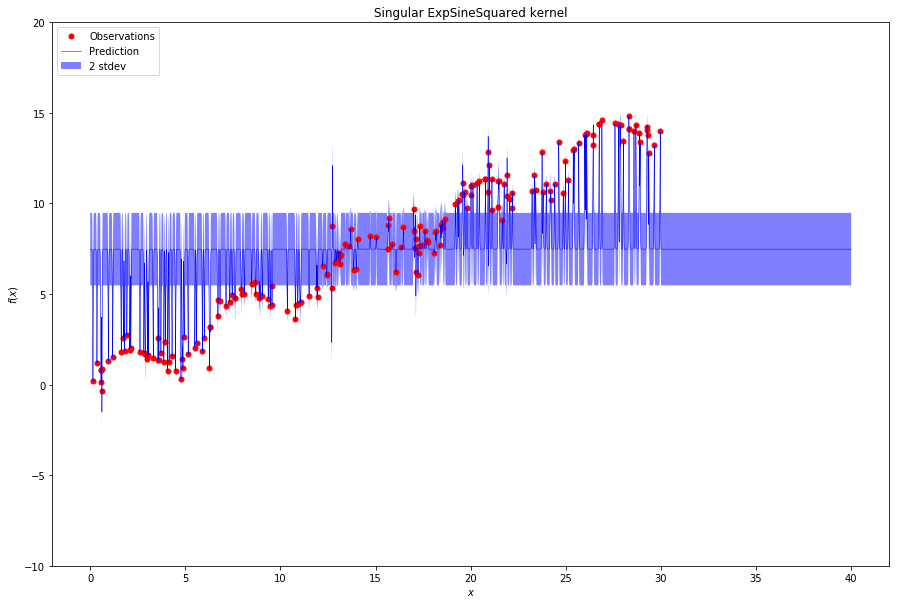

In [24]:
from sklearn.gaussian_process import GaussianProcessRegressor

gp = GaussianProcessRegressor(kernel=kernel_simple, normalize_y=True)
gp.fit(X, y)

plot_pred_vs_true_gp(gp)
plt.title("Singular ExpSineSquared kernel");

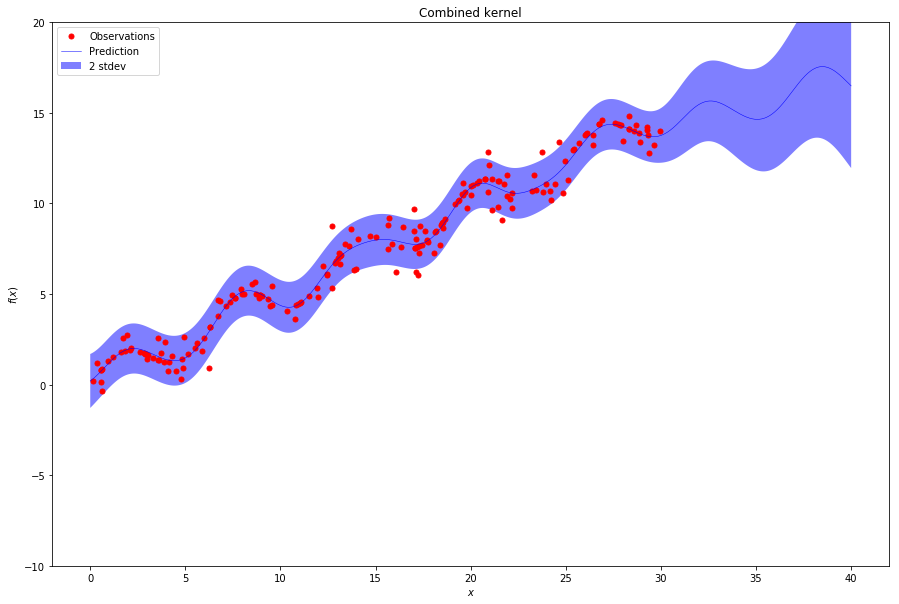

In [25]:
from sklearn.gaussian_process import GaussianProcessRegressor

gp = GaussianProcessRegressor(kernel=k1+k2+k3, normalize_y=True)
gp.fit(X, y)

plot_pred_vs_true_gp(gp)
plt.title("Combined kernel");

We've provided reasonable values for the kernel hyperparameters above. Can you optimize them further to get an even better fit? Think about what the hyperparameters do and optimize the ones you think are most worth tuning.

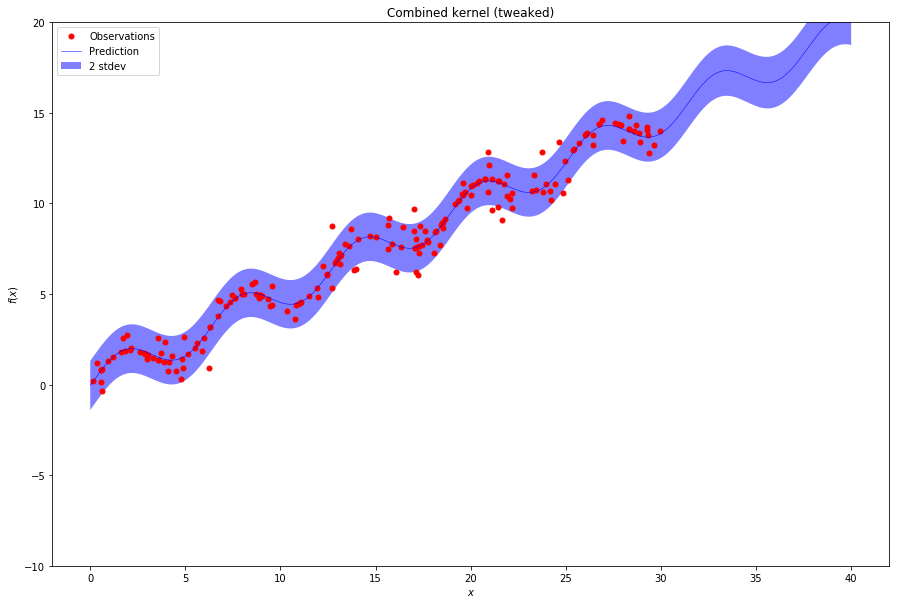

In [28]:
k1 = 4300 * RBF(length_scale=70.0)  # long term smooth rising trend
k2 = 6 * RBF(length_scale=90.0) * ExpSineSquared(length_scale=1.3, periodicity=10*np.pi)  # periodic component
k3 = 0.03 * RBF(length_scale=0.134) + WhiteKernel(noise_level=0.035)  # noise terms

gp = GaussianProcessRegressor(kernel=k1+k2+k3, normalize_y=True)
gp.fit(X, y)

plot_pred_vs_true_gp(gp)
plt.title("Combined kernel (tweaked)");

With "Singular ExpSineSquared kernel" the regressor heavily overfits on the sine training data in $[0,30]$. And after $x=30$ it reverts to the mean (because of `normalize_y=True`).

With "Combined kernel" the regressor captures the sine data much more smoothly. Though the the prediction and confidence interval are still a bit wonky, which suggests that it is still overfitting. Also, after $x=30$ the confidence interval quickly becomes larger, thus it does not extrapolate very well.

Finally, with "Combined kernel (tweaked)" (where periodicity of `k2` is $P=10\pi$) the confidence interval is much tighter and extends beyond the $x=30$ mark.

## Bayesian updates (3 points (2+1))

We consider real data about solar radiation measured by a weather balloon:
https://www.openml.org/d/512. We'll use only the raw data (at least the first 1000 points) and try to learn the (very noisy) trend. 

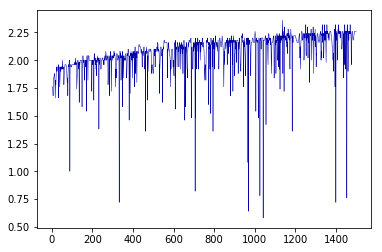

In [4]:
# Get the data
#balloon_data = oml.datasets.get_dataset(512) # Download Balloon data
balloon_data = pd.read_csv('balloon.csv')
#X, y = balloon_data.get_data(target=balloon_data.default_target_attribute);
balloon_data
X = balloon_data.T[1:2].T.as_matrix()
y = balloon_data.T[2:3].T.as_matrix()
X.T
y.T
train = X[:1000]
test = X[1000:1500]
X_train = np.array(list(range(1000)))[np.newaxis].T
y_train = X[:1000].reshape(-1, 1)
X_test = np.array(list(range(1000,1500)))[np.newaxis].T
y_test = X[1000:1500].reshape(-1, 1)
X_all = np.array(list(range(1500)))[np.newaxis].T
y_all = X[:1500].reshape(-1, 1)

pd.Series(X[:1500,0]).plot()

1 . Train a Gaussian process on an increasing amount of samples of the training data. Use a simple RBF kernel:
`RBF(10, (1e-2, 1e2))`

 - Start with 10 _random_ samples and plot the predictions (both the mean and the uncertainty interval) for both training and test data, as shown in class. Also compute $R^2$ on the training data.
 - Repeat and 10 more points, retrain and redraw. Do this a couple of times and interpret/explain what you see. 
 

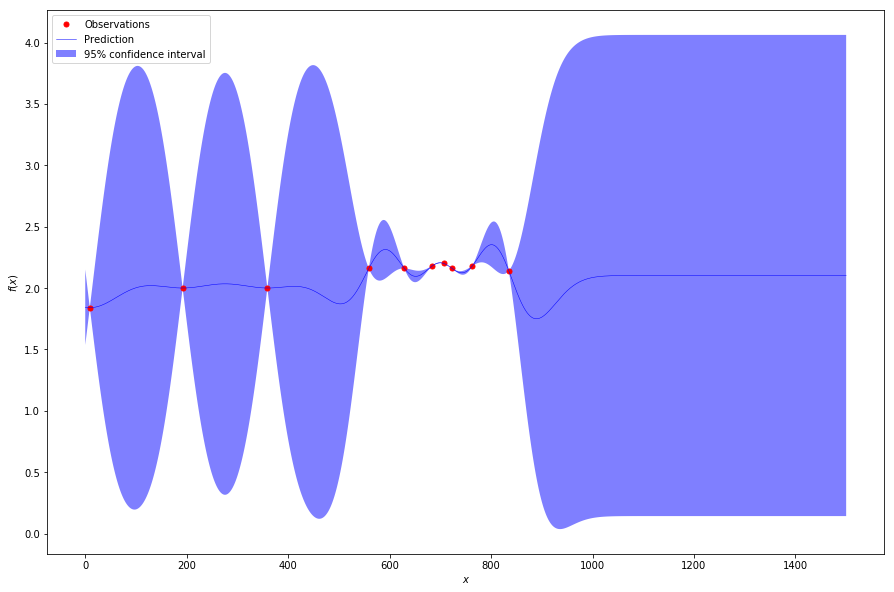

R2 on training data: -0.52463


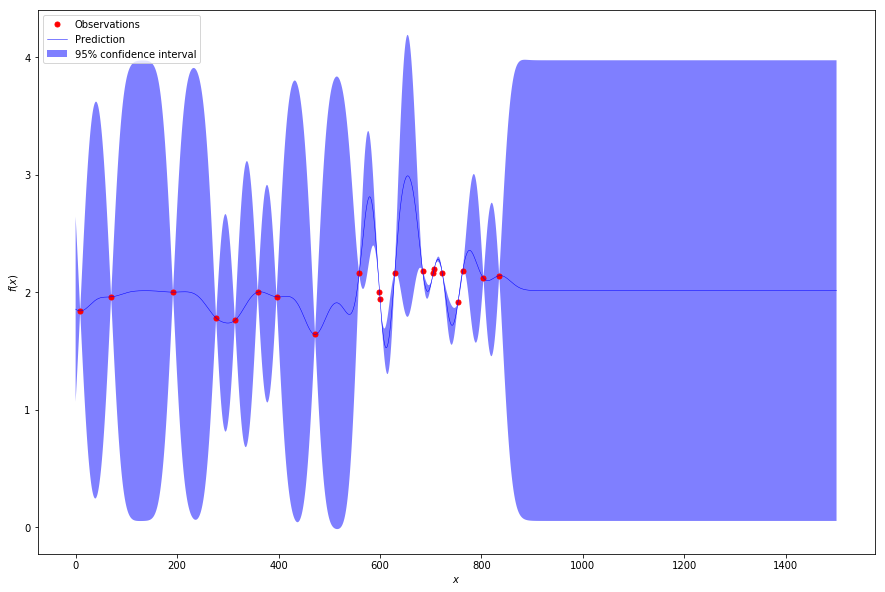

R2 on training data: -2.25582


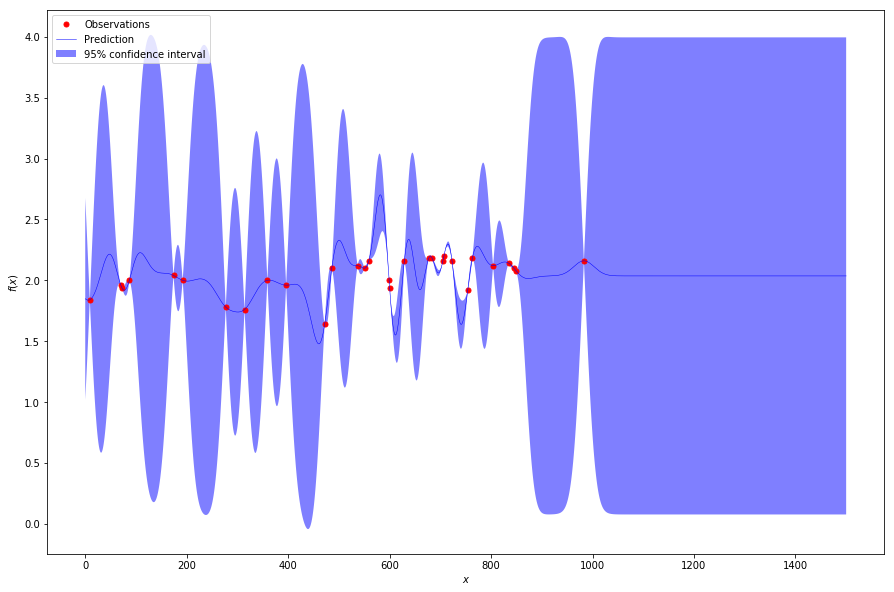

R2 on training data: -1.32987


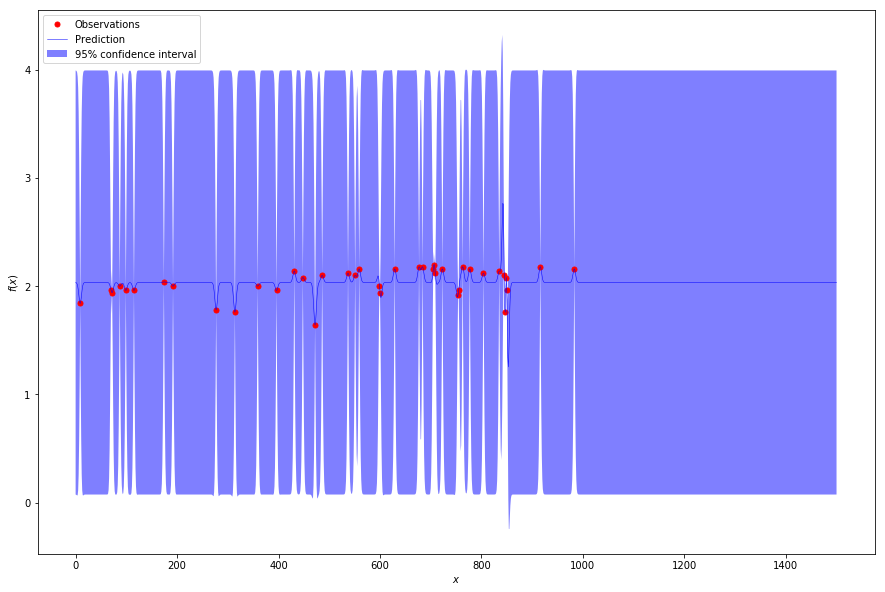

R2 on training data: -0.11925


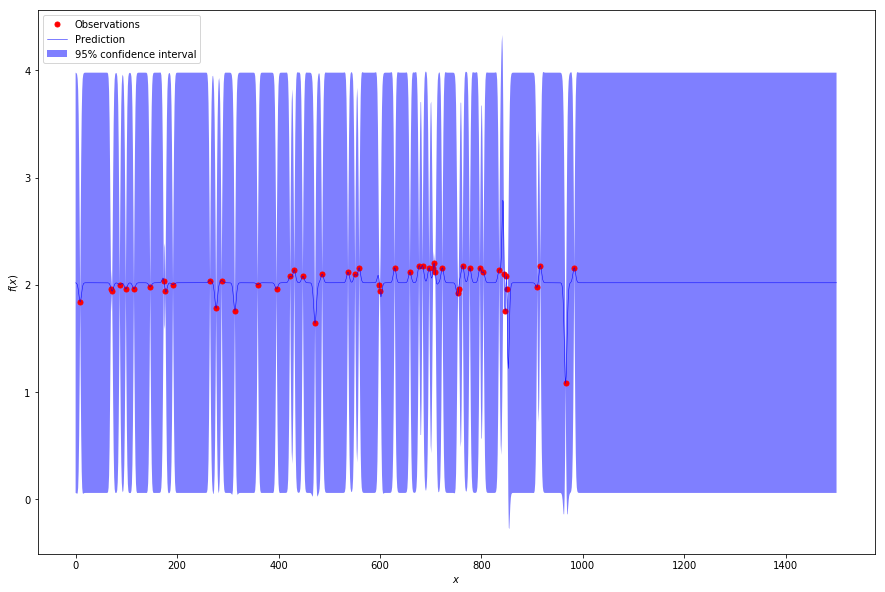

R2 on training data: -0.24775


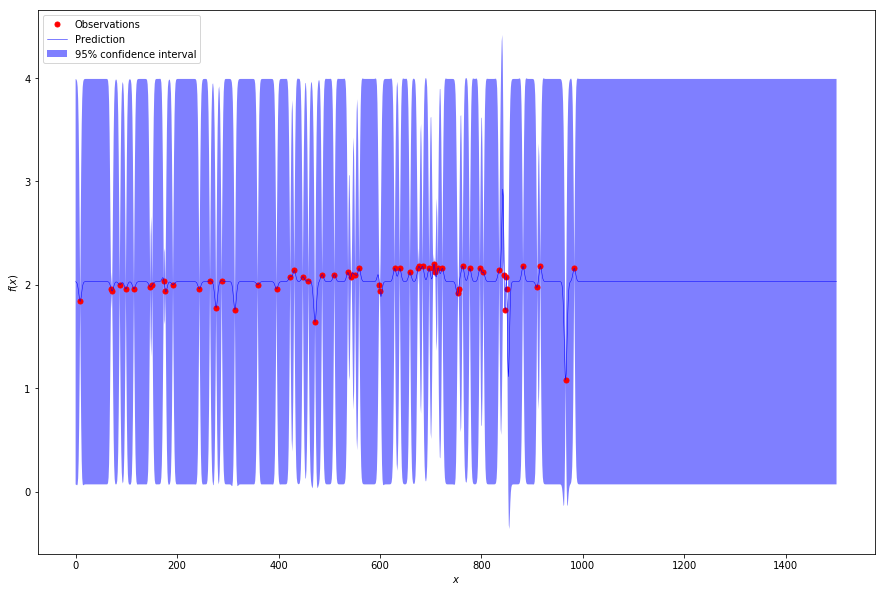

R2 on training data: -0.31488


In [15]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
import random
from sklearn.model_selection import train_test_split

# Mesh the input space for evaluations of the real function, the prediction and
# its MSE
x = np.atleast_2d(np.linspace(0, 1500, 1501)).T

    
# Instanciate a Gaussian Process model
kernel = RBF(10, (1e-2, 1e2))
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=9, normalize_y=True)

def plot_predictions(X, y, gp):
    
    # Fit to data using Maximum Likelihood Estimation of the parameters
    gp.fit(X, y)

    # Make the prediction on the meshed x-axis (ask for MSE as well)
    y_pred, sigma = gp.predict(x, return_std=True)
    y_pred = y_pred[:,0]

    # Plot the function, the prediction and the 95% confidence interval based on
    # the MSE
    fig = plt.figure(figsize=(15,10))
    #plt.plot(x, f(x), 'r:', label=u'$f(x) = x\,\sin(x)$')
    plt.plot(X, y, 'r.', markersize=10, label=u'Observations')
    plt.plot(x, y_pred, 'b-', label=u'Prediction')
    plt.fill(np.concatenate([x, x[::-1]]),
             np.concatenate([y_pred - 1.9600 * sigma,
                            (y_pred + 1.9600 * sigma)[::-1]]),
             alpha=.5, fc='b', ec='None', label='95% confidence interval')
    plt.xlabel('$x$')
    plt.ylabel('$f(x)$')
    #plt.ylim(-10, 20)
    plt.legend(loc='upper left')
    plt.show()    
    print('R2 on training data: {:.5f}'.format(gp.score(X_train,y_train)))
    
#create random samples and plot prediction for those
for n in [10, 20, 30, 40, 50, 60]:
    Xn, X_, yn, y_ = train_test_split(X_train, y_train, train_size=n, random_state=0)
    plot_predictions(Xn, yn, gp)


2 . Train the Gaussian on the full training set.

 - Plot the predictions (including the uncertainty interval) on the full dataset. Evaluate on the test set using $R^2$ 
 - Interpret the results. Is the kernel right? Is the GP under/overfitting?
 - Try to improve the results by tuning the kernel. Do this either manually or using a small grid/random search.

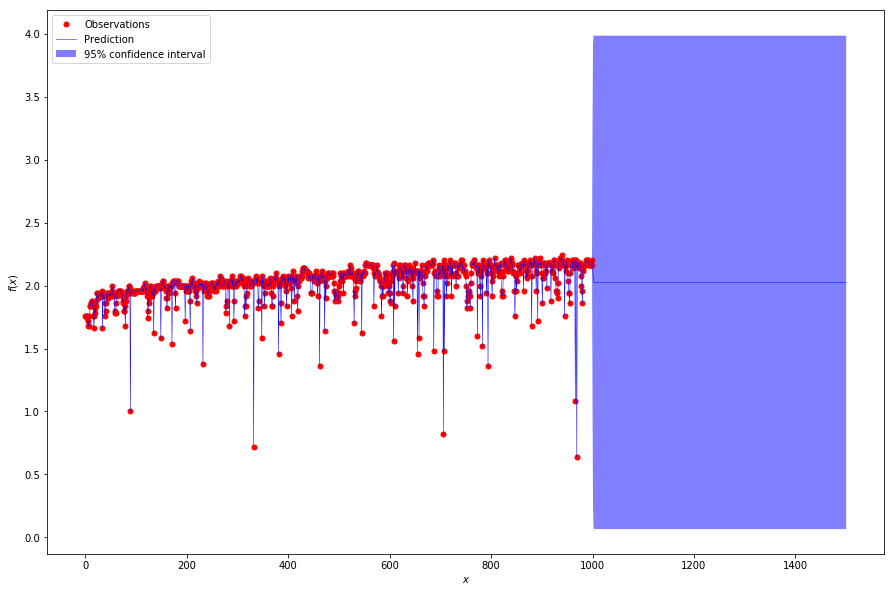

R2 on test data: -0.63439


In [17]:
#plot the predictions for the full data set and print R2 on test set
def plot_predictions_full(X, y, gp):
    # Fit to data using Maximum Likelihood Estimation of the parameters
    gp.fit(X, y)

    # Make the prediction on the meshed x-axis (ask for MSE as well)
    y_pred, sigma = gp.predict(x, return_std=True)
    y_pred = y_pred[:,0]

    # Plot the function, the prediction and the 95% confidence interval based on
    # the MSE
    fig = plt.figure(figsize=(15,10))
    #plt.plot(x, f(x), 'r:', label=u'$f(x) = x\,\sin(x)$')
    plt.plot(X, y, 'r.', markersize=10, label=u'Observations')
    plt.plot(x, y_pred, 'b-', label=u'Prediction')
    plt.fill(np.concatenate([x, x[::-1]]),
             np.concatenate([y_pred - 1.9600 * sigma,
                            (y_pred + 1.9600 * sigma)[::-1]]),
             alpha=.5, fc='b', ec='None', label='95% confidence interval')
    plt.xlabel('$x$')
    plt.ylabel('$f(x)$')
    #plt.ylim(-10, 20)
    plt.legend(loc='upper left')
    plt.show()    
    print('R2 on test data: {:.5f}'.format(gp.score(X_test,y_test)))
    
plot_predictions_full(X_train, y_train, gp)

**TODO:** 
Interpret the results. Is the kernel right? Is the GP under/overfitting?

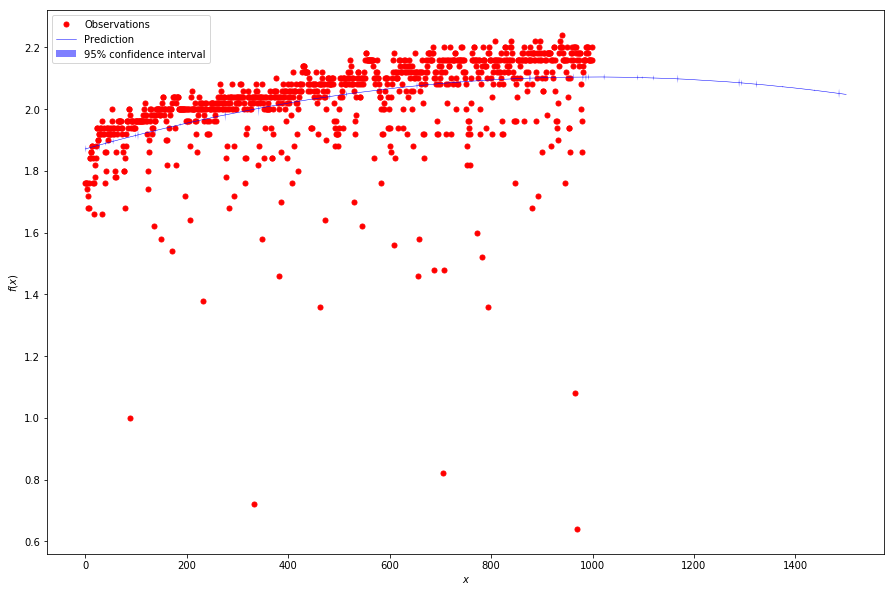

R2 on test data: -0.24149


In [48]:
#improve the results by tuning the kernel

# Instanciate a new Gaussian Process model
kernel_tuned = RBF(1e1, (1e5, 1e6))
gp_tuned = GaussianProcessRegressor(kernel=kernel_tuned, n_restarts_optimizer=9, normalize_y=True)

plot_predictions_full(X_train, y_train, gp_tuned)



## A data mining challenge (4 points)

The goal here is to use everything you have learned to build the best model for a given classification task. We will use two tasks hosted on OpenML, so you will all receive the same cross-validation splits, and your model will be evaluated on the server. The goal is to reasonably select algorithms and hyperparameter settings to obtain the best model. You can also do model selection, pipeline building, and parameter optimization as you have done before. Skeleton code is provided in the OpenML tutorial. You need to optimize the AUROC score (calculated using 10-fold cross0-validation).

- Challenge 1: Detects accents in speech data.

    - The OpenML Task ID is 167132: https://www.openml.org/t/167132
    - The dataset description can be found here: https://www.openml.org/d/40910
    - Leaderboard: https://www.openml.org/t/167132#!people
    
- Challenge 2: Image recognition (CIFAR-10 subsample).

    - The OpenML Task ID is 167133: https://www.openml.org/t/167133
    - The dataset description can be found here: https://www.openml.org/d/40926
    - Leaderboard: https://www.openml.org/t/167133#!people
    - Note that this is a high-dimensional dataset (and not so small). Think carefully about how to run experiments in the  time available.
    
- You are able to see the solutions of others (by clicking in the timeline or run list), so you can learn from prior experiments (what seems to work, how long does it take to train certain models, ...). Resubmission of the exact same solution is not possible.
- You can share one account (one API key) per team. In case you use two, we take the one that performs best.
- Document the different experiments that you ran in this notebook (running them can of course be done outside of the notebook). For each experiment, provide a description of how and why you chose the algorithms and parameters that you submitted. Reason about which experiments to try, don't just do an immense random search.
- Points are rewarded as follows (independently for each task):

    - 1 point for the breadth of experiments you ran (algorithms, pipelines, hyperparameter settings)
    - 1 point for reasoning/insight and interpretation of the results
    - 1 (bonus) point for every team who has uploaded the best solution thus far **on AUC** (who reaches the top of the leaderboard at any moment during the assignment)
        - Exception: simply repeating top models with nearly identical hyperparameters. This will be checked on the timeline.
        - Note: On the leaderboard page, the 'frontier' line is drawn, and your top ranking is also shown in the leaderboard.
        
Note: Report the AUC scores of your best models in your report as well. In case of issues with OpenML we will use the experiments and scores mentioned your report.